<a href="https://colab.research.google.com/github/GDS-Education-Community-of-Practice/DSECOP/blob/main/Singular_Value_Decomposition/01_singular_value_decomposition_module.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Singular Value Decomposition


---


#### Authored by Sebastian W. Atalla
##### UNC Chapel Hill | Dept. of Physics & Astronomy

# **Background**

Many undergraduate physics majors take at least one mathematical methods course, in which the curriculum usually includes material on the important linear algebra concept of eigensystems; namely, the determination of *eigenvectors* and *eigenvalues*. 

Eigensystems appear in all disciplines of physics, from classical mechanics to quantum mechanics; thus, while it is generally expected that a physicst can determine a system's eigenvectors and eigenvalues, practical application is sometimes unintuitive. 

This module focuses on the **singular value decomposition** (SVD), which decomposes an $m \times n$ *rectangular* matrix $A$ into constitutent matrices,

\begin{equation}
  A = U S \, V^{T}
\end{equation}

where $U \in \mathbb{R}^{m \times m}$ and $V \in \mathbb{R}^{n \times n}$ are orthogonal, and the matrix $S \in \mathbb{R}^{m \times n}$ is a diagonal matrix of the *singular values* of $A$.

There exist some differences between a canonical eigendecomposition and the SVD, wherein eigendecomposition via diagonalization of a *square* matrix $A$ is of the form

\begin{equation}
A = W 𝛬 \, W^{-1}
\end{equation}

in which the columns of $W$ are the *eigenvectors* of $A$, and the diagonal matrix $𝛬$ holds the corresponding eigenvalues. Note that while eigendecomposition only works for square matrices, SVD is computable for rectangular matrices.

The relationship between SVD and diagonalization is that the SVD allows one to determine the eigenvectors and eigenvalues of $AA^{T}$ (for which the columns of $U$ are the eigenvectors) or $A^{T}A$ (for which the columns of $V$ are the eigenvectors); the matrix $S$ thus corresponds to the square roots of the non-zero eigenvalues of either permutation of the product of $A$ and its transpose. 

Ironically, the problems that SVD is adept at solving are not readily apparent; however, this algorithm is crucial for a litany of applications, such as:


*   Image compression
*   Principal component analysis (PCA)
*   Clustering
*   Dimensionality reduction
*   Linear system solvers

This list is by no means exhaustive, but it does serve to emphasize the power of the SVD with respect to manipulating data. As is the case for many linear algebra routines, the SVD algorithm is computationally expensive when poorly implemented and fairly complicated when implemented efficiently. Fortunately, the importance of SVD in data science workflows has seen it implemented in a multitude of packages across many languages - for this module, Python's numpy/scipy implementions will be utilized.

<br>

**This module will attempt to explore applications of SVD in image compression, clustering, and PCA.**


In [1]:
#@title Solutions

import os
import hmac
import hashlib

def encrypt_solution(solution):
  """
  Function for unidirectional encryption of solution strings
  """
  salt = os.urandom(16)
  hash = hashlib.pbkdf2_hmac('sha256', solution.encode(), salt, 10000)
  return (salt, hash)

def check_answer(solution, salt, hashed_guess):
  check = hmac.compare_digest(
      hashed_guess, hashlib.pbkdf2_hmac('sha256', solution.encode(), salt, 10000)
  )
  return check

possible_solutions = {
    'exercise13' : 
        [
          (b'\x1e\x8a\x012|\x88x\xb0Q\x05\x87\x9b6\x95?\xd5',              b'\x80\xd8&\xbc7\xd9d\xd5~x\xf4W6\x06h5\xfe\tE\x11T\xa9\xa97i6D#\xb1K\xb6\xb8'), 
          (b'\x95W\xe5\xf0\x0e\xfc<\xf9\x03\xdc\xdc\x9e\x16\xea\xe7\xca',  b'&\x16\xc7]\xaa\xb5\xbb\x8aY\x82\xe4\x86\nL\x81\x07cG\xcb\xfe\x96\x05\xe0\x19%;Sf\xc6\xb2\xf9\x87'), 
          (b'\xdc\xca\xa8\xb74\x8e\xf4\x0c\xd5\xe2\x9eHJ`\xce\xe4',        b'A5\xbaSu\xb6M\xcbT\xfa\xcc\x86\xa1`\x18\x0c_\xef[\xbf\x03;\xd68\xd3-\xd8\xa1\xb3\xf2q\xbc'), 
          (b'SB\xf9\x81Y\x89\xc9iF\xadI?\xf5\x91V\xb3',                    b'X5\xc6M\x9d\xda\xbc!A\x9f\x1d\xd2\xac\x9dH[\xe5k\xd3\x14\xc5\xa2c`\xde\xa4M\xf36\x06kE'), 
          (b'#\xea\xe3f\xe6\xd9N\x92m\x1cH\xec\x87\xcb\xc3N',              b'\x84\x9e\xf9]\xc2\xd7&\x18L\xa7\xdc\xad\x8dh\xcf\x7f\x82H\x96\xde\x04\xe3\xa62\xcbzP\x0f\xb4\x92We'), 
          (b'Z\x15t\x18n:VO\x19-\xbc\x93\xce\xf2g\xc4',                    b'b\xad\xe3<\xe8s\xa5\x15\xb8\x94\xdfX?\xdf\x07\r\xde\xaeB\x95\xe6^k\x89\xfb(\xadJ\x8fcA2'), 
          (b'\xd9P\x14\x10\x0e\xf3M\xc7\x8c\xf4\xae]\x83y\xb7\x8a',        b'\xb2*l\xcb$oH\x9b\xfe>\x15!o\xd6\xf6\x83$w.\xf3ju\xaf\xb4I\x8c\x91\xa5\x01\xd1j\x9b'), 
          (b'\xc8\xdc\xeb\xf7\x82RW\xcf\xe3>\xd7C\xc0h\x1bb',              b'\x15\x9a\xdc6z7\xdb@{\x8aA\xbb\xd5\x9e\x9eP\xe7\x93\x0c\x01T\xe8x\x7f\x81\xe2\x9e\xe1.\xaa\xf7U'),
          (b'\xe3\xa0\xfe\xa9\x8d\xb6\x0cl\xa2Cl\xfbJ:\xf7d',              b'\x18\xf2-\xd8%\xd9Q\xd6/r\xa8b""`\xd2VN\xa9O$\x13\xa9\xd0kX\n`\xfdd\xa5\x12')
        ]
}

# **Image Compression**

With the recent launch of the James Webb Space Telescope (JWST), cosmological images of unprecedented quality are being regularly transmitted back to Earth from 1.5 million kilometers away. With a radio capable of 28 Mbps throughput, the bandwidth of the JWST transmitter rivals and even surpasses that of some internet connections on Earth. However, despite possessing a datalink with speeds comparable to broadband internet, the telescope only has enough onboard storage for approximately 65 GB of data.

From the perspective of the technical limitations of an apparatus as advanced as the JWST, the importance of good data compression is apparent, potentially shrinking a hundred megabyte image into one of only tens of megabytes.

Many modern compression algorithms are considered *lossless*, such as the algorithms used by the JWST, in that they are able to reconstruct the compressed data into its original representation with no loss of fidelity. However, many *lossy* algorithms, such as the ubiquitious JPEG image format, are suitable nonetheless for everyday use and are still the standard for many technical applications.

This section will investigate the feasibility of using SVD to reduce the amount of data needed to render an image with acceptable quality.

In [2]:
#@title Application
#@markdown Suppose there exists a telescope installation on a remote island tasked solely with the purpose of capturing images of Saturn. One evening, a particularly stunning image is captured and the scientists on the island wish to send it to their colleagues.
#@markdown
#@markdown ---
#@markdown *Execute this cell to retrieve image.*
import numpy as np
import plotly.express as px
import imageio as iio
import xarray as xr

# Despite the description above, this image was captured by NASA from a telescope in space.
img = iio.imread('https://images-assets.nasa.gov/image/PIA05982/PIA05982~medium.jpg')

fig = px.imshow(img)
fig.update_layout(showlegend=False)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(autosize = False, width = 1280, height = 663)
fig.show()

ModuleNotFoundError: No module named 'plotly'

Unfortunately, there is no internet on the island and all communication must be transmitted via satellite; however, the satellite is only over the island for a short period of time during which uplink may occur. This limits the size of transmitted data, since any uploads must be completed during a brief window of time. Ultimately, this doesn't necessarily make the image significantly worse and much of the lost data may be compensated for by other means, such as interpolation/upsampling to recover lost dimensionality and denoising to clean up any artifacts introduced during compression.

At its original size, the image is too large to fully transmit before the satellite is out of range. However, consider that an image is simply a matrix of pixel intensities; thus, an image is a matrix $A$ which may be decomposed into its singular values. SVD may be used to reduce the amount of data needed to represent the image, making it possible to upload the image to the satellite.

### Implementation

Singular value decomposition is implemented in Numpy as 

```
u, s, v = np.linalg.svd(A)
``` 

Numpy's implementation of SVD does not natively work on RGB images, since they exist as a 3D array containing a slice for each channel of the image. The code below shows how `np.linalg.svd` may be extended to work on RGB images.



In [ ]:
# `np.linalg.svd` does not perform SVD on RGB images. The following function takes 
# an input `image` and a desired number of singular values `n` and computes a
# channel-wise SVD, after which the channels are collated and re-formed into 
# a uint8 ndarray representable as an RGB image.
def rgb2svd(image, n):
  """ 
  Compute the SVD of a 3-channel RGB image. 
  
  This function additionally takes a parameter `n` to specify how many
  singular values should be extracted from the image, since this function takes
  significantly longer to execute for large images. 
  ...
  Parameters
  ----------
  image : ndarray
      Multi-channel matrix containing image data.
  n     : int
      Number of singular values to extract from the image.
  """
  # Instantiate a list to accumulate the R,G,B channels of the image.
  acc = []

  # Iterate through the 3 channels of the image and decompose each one.
  for i in range(image.shape[2]):
    # This line performs the actual SVD on the current channel denoted by `i`.
    u, s, v = np.linalg.svd(image[:,:,i], full_matrices=False)
    # Recompose the image using `n` singular values from the SVD.
    # Necessary to constrain pixel intensities to be positive due to uint8 cast.
    aa  = np.abs(np.dot(u[:,:n], np.dot(np.diag(s[:n]), v[:n,:])))
    # Rescale the RGB values between [0, 255] and cast to uint8.
    res = (aa * 255 / np.max(aa)).astype('uint8')
    # Collect the compressed channel in `acc`.
    acc.append(res)

  # Create the new, compressed image by stacking the channels in the third dimension.
  return np.dstack(tuple(acc))

Generally, it is beneficial to pre-compute large amounts of data rather than computing on-the-fly inside a loop. This function creates a "gallery" of images reconstructed from increasing numbers of singular values, which is then plotted below. Use the `start`, `stop`, and `step` parameters below to adjust how the singular values are sampled.

In [ ]:
# Alter these parameters to change the number of singular values sampled from the image.
# start - the number of singular values at which to begin sampling
# stop  - the number of singular values at which to stop sampling
# step  - the singular value sampling rate
start, stop, step = 1, 120, 10

# This function may take a while to run depending on the size of the input image.
# Change the `step` parameter above to reduce the runtime of this function.
def svd_gallery(image):
  """ 
  Generate a 'gallery' of SVD compressed images. 
  ...
  Parameters
  ----------
  image : ndarray
      Multi-channel matrix containing image data.
  """
  gallery = []
  x, _, _ = image.shape

  for i in np.arange(start, stop, step, dtype=int):
    if i == 0: i = 1
    gallery.append(rgb2svd(image, n=i))

  return np.asarray(gallery)

img_gallery = svd_gallery(img)


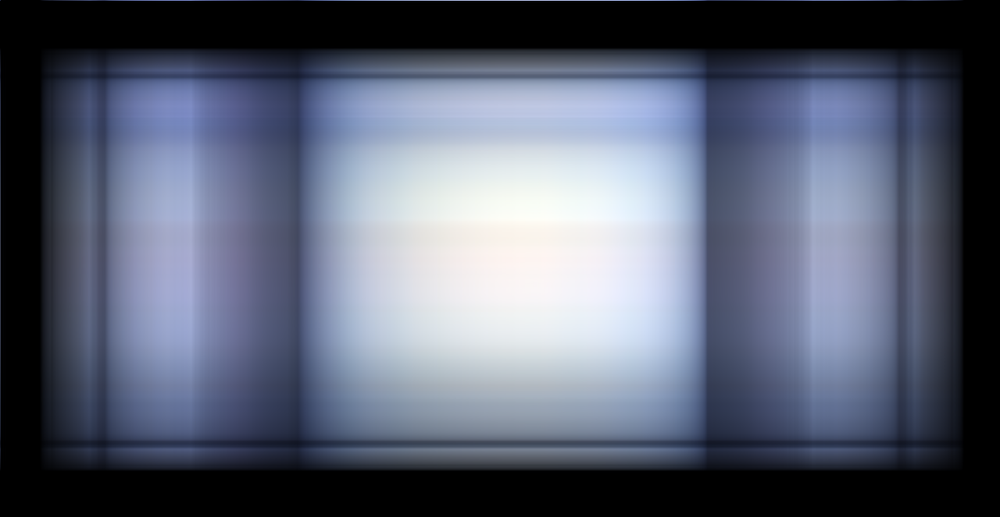
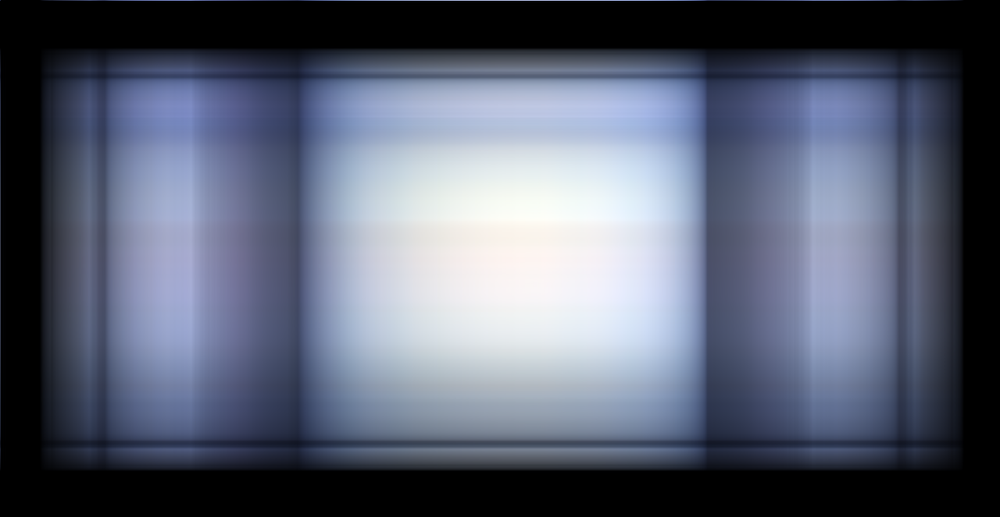
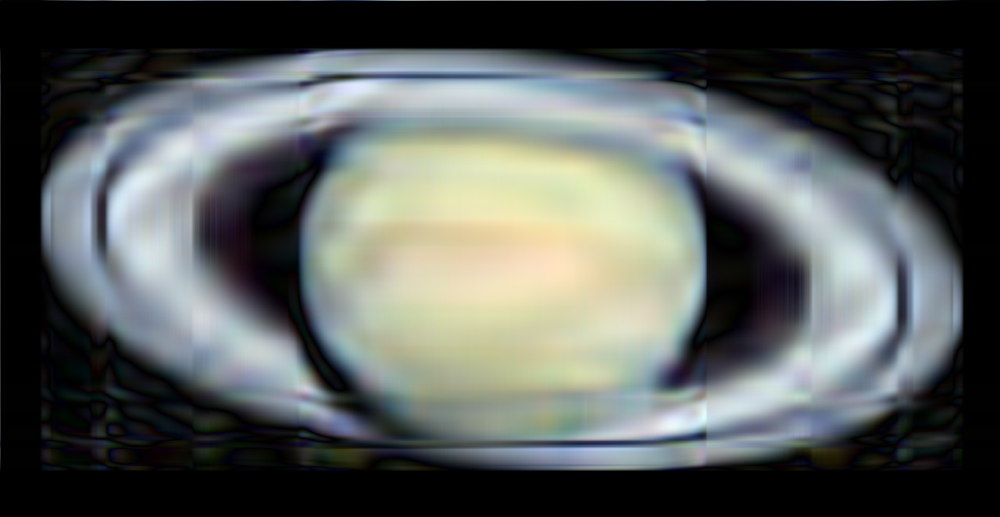
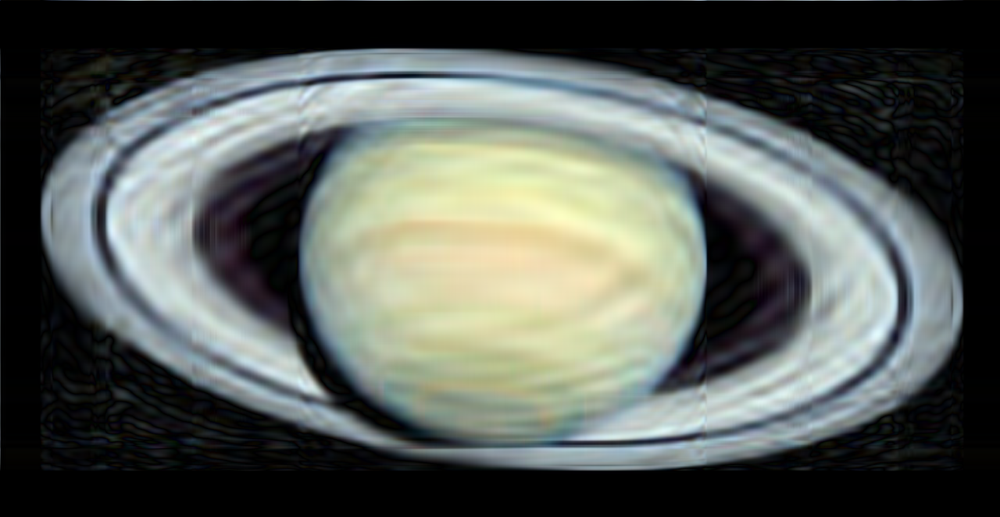
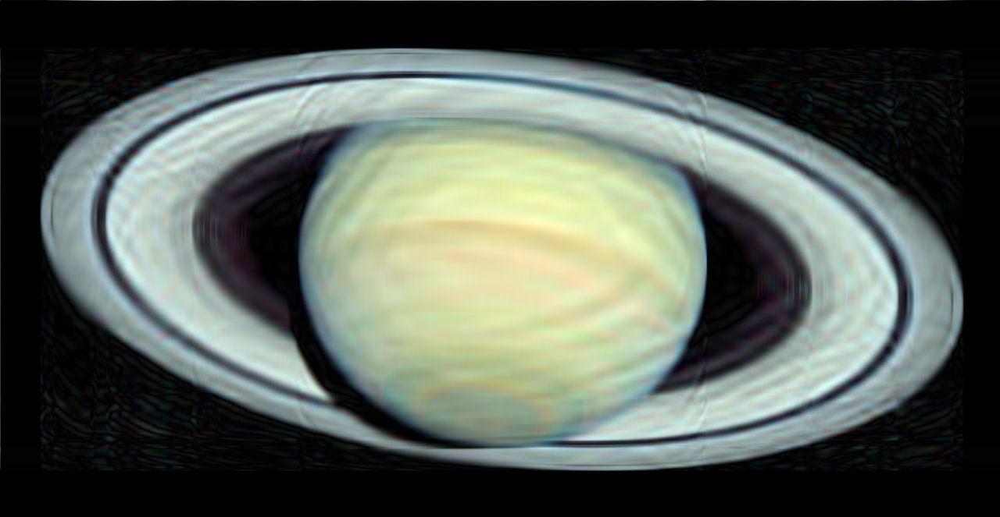
...
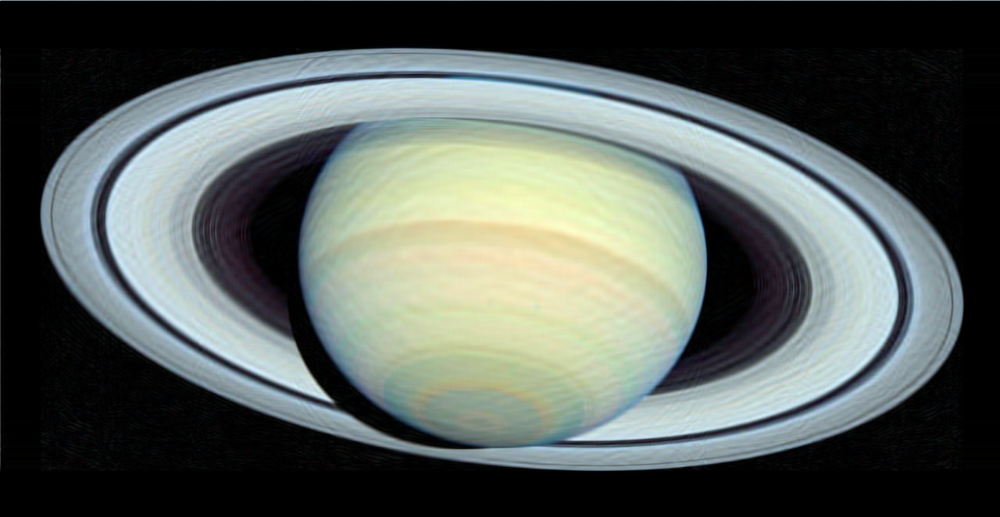
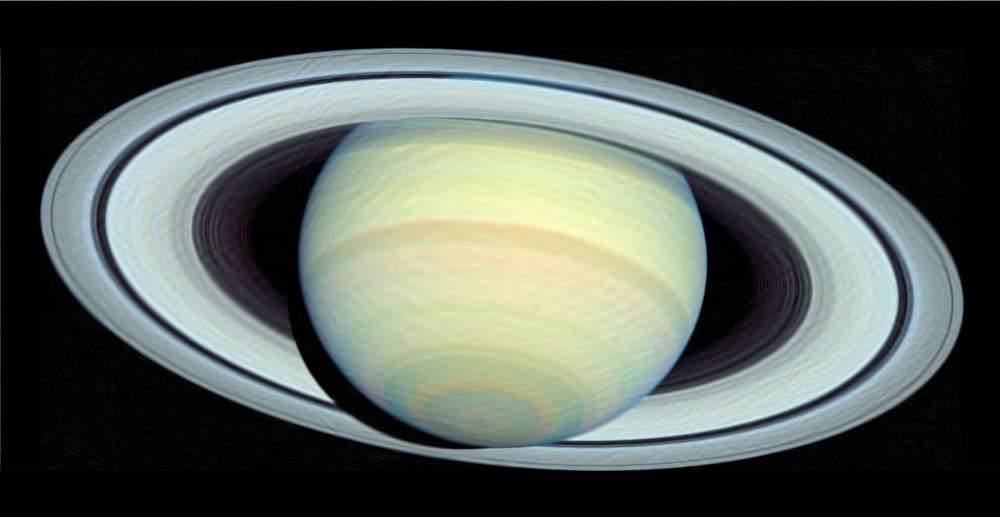
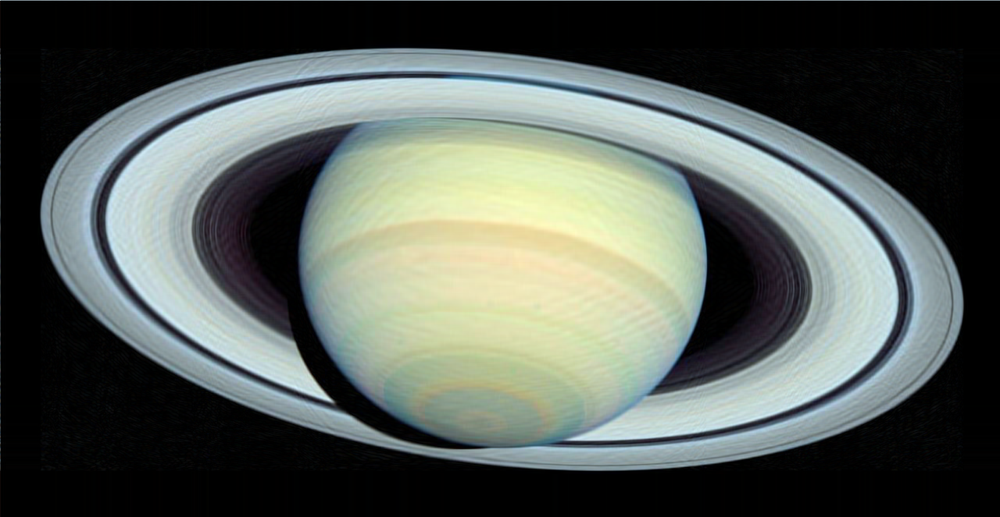
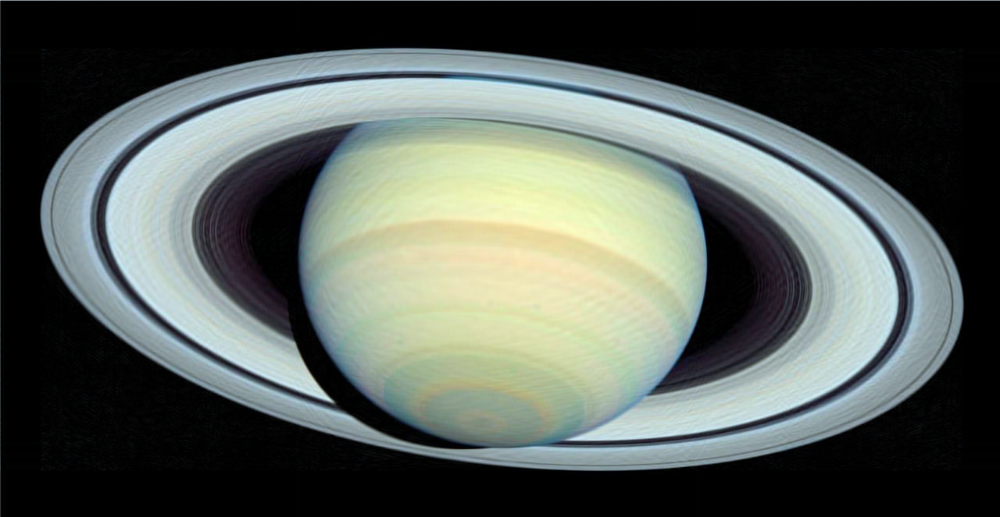
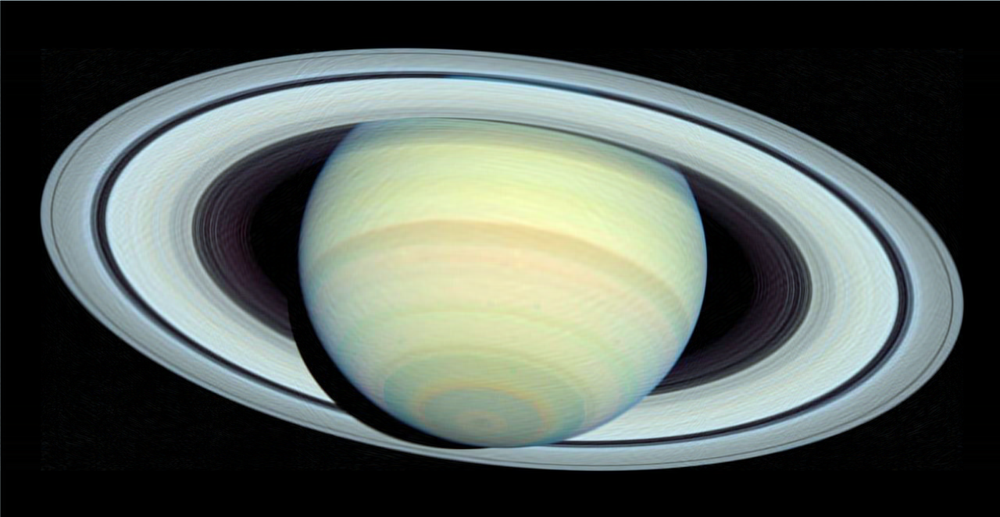

In [ ]:
#@title Visualization of singular value image reconstruction
#@markdown The plot below contains a slider object, which may be used to cycle through the reconstructed images - from the image reconstructed from the fewest singular values to an image reconstructed from significantly more. <br>
#@markdown The number of singular values is truncated due to the size of the data.
#@markdown Use the slider in the plot below to visualize the reconstructed images and determine at what point the diminishing returns on the number of singular values used to reconstruct the image become apparent.

# Plotly Express requires `xarray` data to generate animations.
h, w, d = img.shape
sval_coord  = np.fromiter(
    (1 if i == 0 else i for i in range(start, stop, step)), 
    dtype=int)
y_coord     = np.arange(h)
x_coord     = np.arange(w)
d_coord     = np.arange(d)
dsimg = xr.DataArray(
    data = img_gallery, 
    dims = ['Number of singular values sampled by reconstructed image', 'y', 'x', 'channel'],
    coords = [sval_coord, y_coord, x_coord, d_coord],
    attrs= {
        'long_name': 'Reconstructed Images From N Singular Values',
    }
)

fig2 = px.imshow(
    dsimg, 
    animation_frame="Number of singular values sampled by reconstructed image", 
    binary_string=True,
    title=dsimg.attrs["long_name"])
#fig2["layout"].pop("updatemenus")
fig2.update_layout(showlegend=True)
fig2.update_xaxes(visible=False)
fig2.update_yaxes(visible=False)
fig2.update_layout(autosize = False, width = 1280, height = 663)
fig2.show()

The *compression ratio* is the ratio of the sizes of the original and uncompressed data, typically expressed as

\begin{equation}
  \text{compression ratio} = \frac{\text{uncompressed size}}{\text{compressed size}}.
\end{equation}

This ratio is often used as a measure of quantifying the effectiveness of a compression algorithm. Increasing the compression ratio while minimizing loss of quality to the compressed media is one of the most important considerations in compression.

---

**Exercise 1.1** &nbsp;&nbsp;&nbsp; In the figure above, use the slider to sample the singular values from which the image has been reconstructed, and determine the compression ratio from the image reconstructed from the fewest singular values while still remaining sufficiently detailed.

In [ ]:
def compression_ratio(n):
  """
  Calculate the compression ratio from the number of singular values used to reconstruct an image.

  This function does not include any scaling - it only calculates a single channel and does not account for sizeof(dtype).
  ...
  Parameters
  ----------
  n : int
      Number of singular values used to reconstruct compressed image.
  """
  # Single RGB channel
  u, s, v = np.linalg.svd(img[:,:,1], full_matrices=False)
  original    = (u.size        + s.size      + v.size)
  compressed  = (u[:,:n].size  + s[:n].size  + v[:n,:].size)
  ratio       = original/compressed
  print(f'\n\tOriginal size: \t\t{original}\t\t{s.size} singular values')
  print(f'\tCompressed size: \t{compressed}\t\t{s[:n].size} singular values')
  print(f'\n\tCompression ratio: \t{original}/{compressed} = {ratio}')

In [ ]:
#@title Compression Ratio
#@markdown Execute this cell to calculate the compression ratio from the number of sampled singular values.

n_svd_sample = input('Number of singular values sampled by reconstructed image: ')
compression_ratio(int(n_svd_sample))

Number of singular values sampled by reconstructed image: 41

	Original size: 		1288872		663 singular values
	Compressed size: 	79704		41 singular values

	Compression ratio: 	1288872/79704 = 16.170731707317074


In [ ]:
#@title Distribution of Singular Values
#@markdown Execute this cell to visualize the distribution of the first 120 singular values for the decomposed image. Notice that the singular values are computed such that the largest ones make up the first *N* singular values, after which the magnitude of the values decays with a seemingly exponential character.
#@markdown
#@markdown Using this information, consider the relationship between the magnitude of the singular values and the information retrieved from them during reconstruction.
#@markdown
#@markdown - How many singular values were needed to reconstruct the image with passable fidelity?
#@markdown - Was any significant detail recovered from including singular values further away from the origin, i.e., were ~60 singular values appreciably better than ~80?
#@markdown ---
#@markdown **Exercise 1.2** &nbsp;&nbsp;&nbsp; What does this distribution suggest about the significance of the singular values for the compression ratio determined in Exercise 1.1?
_, s, _ = np.linalg.svd(img[:,:,1], full_matrices=False)
xx = np.arange(120)
fig3 = px.line(x = xx, y = s[:120], title='Distribution of Singular Values')
fig3.update_layout(autosize = False, width = 1280, height = 600)
fig3.show()

In [ ]:
#@title Conclusion
#@markdown Singular value decomposition is a robust compression method for images that don't require fine detail or lossless reconstruction. For instance, this would not be an ideal compression algorithm for medical imaging, where any lost detail could obscure a life-threatening diagnosis. However, imaging applications that prioritize general features - such as faces in a facial recognition database or deep learning training sets -  are excellent candidates for lossy compression algorithms such as SVD.

#@markdown ---

#@markdown **Exercise 1.3** &nbsp;&nbsp;&nbsp; Altering an image *after* the image has been captured is called *post-processing*. 
#@markdown Consider the example from the beginning of this section, in which the image must be compressed in order to be transmitted via satellite. 
#@markdown Once the image has been downloaded from the satellite, what is a post-processing technique that could be applied to the image to improve any loss of fidelity incurred by the SVD compression?
#@markdown *There are some hints in this section - read carefully! Outside research is also encouraged.*
#@markdown
#@markdown ___Execute this cell and enter a single word response to check your answer.___
exercise13_answer = input("Enter a single word answer: ")

result = [
    check_answer(exercise13_answer, salt, hash) for 
      (salt, hash) in possible_solutions["exercise13"]
]

# makeshift fuzzer
if (True in result):
  print("\nYour answer is probably correct!")
else:
  partial, fail_state = False, False
  current_index = 0
  while (not partial and not fail_state):
    for i in range(len(exercise13_answer)):
      res = [
          check_answer(exercise13_answer[:i], salt, hash) for
            (salt, hash) in possible_solutions["exercise13"]
      ]
      if (True in res):
        print("\nA partial solution may have been found, but the answer may not have been spelled correctly.")
        partial = True
        break
      else:
        current_index += 1
      
      if (current_index == len(exercise13_answer) and not partial):
        print("\nYour answer wasn't found in this exercise's solution dictionary, but that doesn't mean it's wrong. Check your spelling and try again.")
        fail_state = True
        break

Enter a single word answer: interpolation

Your answer is probably correct!


# **Clustering**

Clustering is the "Hello, World" of data science - a fundamental but useful technique for grouping unlabeled data.

One of the most fundamental clustering algorithms is known as *k-means clustering*. *K*-means works by finding *centroids* in the data that represent clusters, from which one may infer relationships within and between the data, often referred to as *groups*.


## *K*-means Clustering

To demonstrate a simple application of *k*-means, the `scikit-learn` package provides functions for randomly generating datasets with the `make_blobs` function, located in the `datasets` namespace.

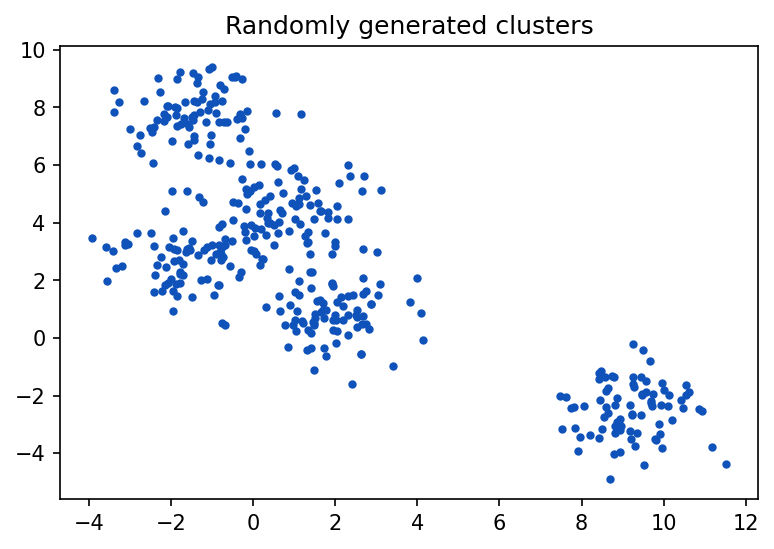

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

plt.rcParams['figure.dpi'] = 150

x, yT, c = make_blobs(
    n_samples       = 400, 
    centers         = 5, 
    cluster_std     = 0.9, 
    random_state    = 0, 
    return_centers  = True
    )

plt.scatter(x[:,0], x[:,1], marker='.', c='#0F52BA')
plt.title('Randomly generated clusters')
plt.show()

This "random" data is generated in such a way to still have discrete groups that are seperable by eye - it should not be assumed that real data will have this characteristic. For example, there are 2 distinct groups in the corners of the plot; in the top left group, there are yet 4 more distinguishable groups. If the *k*-means clustering method is successful, there should be 5 groups extracted from the data and 5 centroids indicated by a red mark.

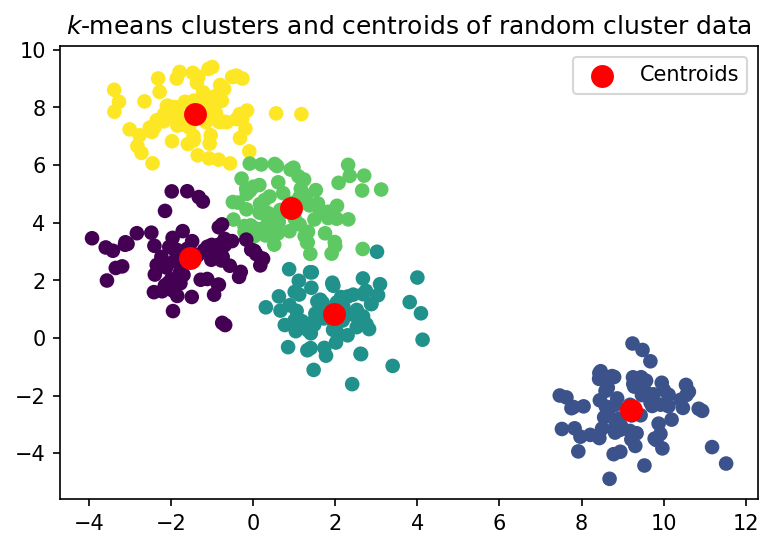

In [5]:
kmean = KMeans(n_clusters = 5)
kmean.fit(x)
yK = kmean.predict(x)
center = kmean.cluster_centers_

fig_k = plt.figure()
ax_k= fig_k.add_subplot(111)

ax_k.scatter(x[:,0], x[:,1], c = yK)
ax_k.scatter(center[:,0], center[:,1], c = 'red', s = 100, label='Centroids')
ax_k.legend(loc='upper right')
ax_k.set_title('$k$-means clusters and centroids of random cluster data')
fig_k.show()

The standard *k*-means algorithm has a significant limitation, which is evident when exploring how the algorithm actually works. Random centroids are first placed within the data, after which iterative optimizations to the positions of the centroids are made based on the Euclidean distance of the data to a local centroid. Eventually, a solution converges and *k* clusters are discretized. This effectively draws a linear boundary, imagined as a straight line, between the clusters. This is fine if the data are separated as in the previous example, but fails to accurately cluster data if nonlinear boundaries exists.

To demonstrate this, data in concentric circles may first be initialized by `sklearn.datasets.make_circles`.

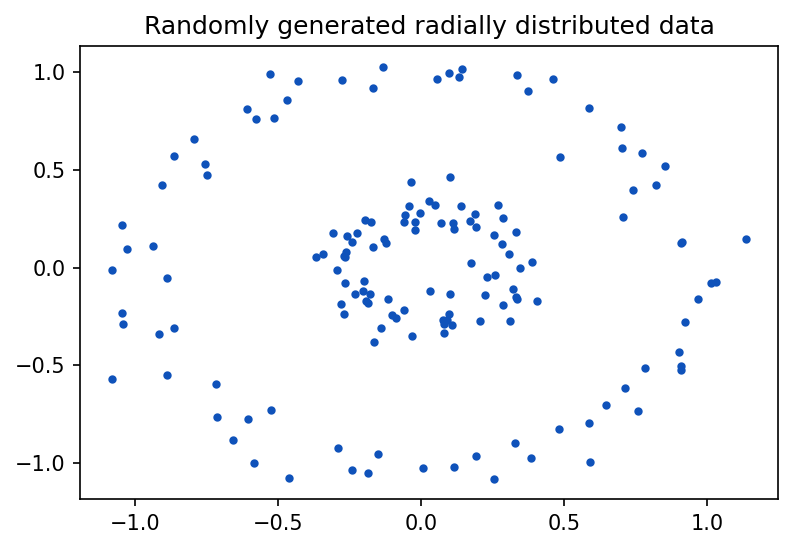

In [6]:
from sklearn.datasets import make_circles
circle, circle_clusters = make_circles(
    n_samples     = 150, 
    noise         = 0.075, 
    factor        = 0.3, 
    random_state  = 0
    )

fig_circle = plt.figure()
ax_circle = fig_circle.add_subplot(111)
ax_circle.scatter(circle[:, 0], circle[:, 1], marker='.', c='#0F52BA')
ax_circle.set_title('Randomly generated radially distributed data')
fig_circle.show()

Applying *k*-means clustering to the dataset clearly fails to differentiate the clusters - furthermore, the linear boundary drawn by the *k*-means algorithm is especially apparent by how the data is separated.

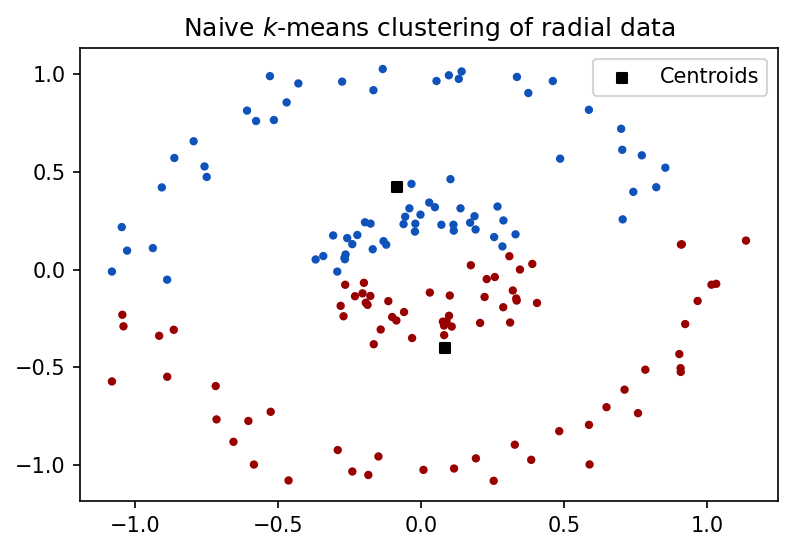

In [7]:
kmean_circle = KMeans(n_clusters = 2)
kmean_circle.fit(circle)
yK_circle = list(kmean_circle.predict(circle))
center_circle = kmean_circle.cluster_centers_

for i, x in enumerate(yK_circle):
  if x == 0:
    yK_circle[i] = '#0F52BA'
  if x == 1:
    yK_circle[i] = '#990000'

fig_circle_kmeans = plt.figure()
ax_circle_kmeans = fig_circle_kmeans.add_subplot(111)

ax_circle_kmeans.scatter(circle[:,0], circle[:,1], c = yK_circle, marker='.')
ax_circle_kmeans.scatter(center_circle[:,0], center_circle[:,1], c='#000000', marker='s', s = 20, label='Centroids')
ax_circle_kmeans.legend(loc='upper right')
ax_circle_kmeans.set_title('Naive $k$-means clustering of radial data')
fig_circle_kmeans.show()

## Spectral Clustering

There exists an alternative clustering algorithm, called *spectral clustering*, that is capable of differentiating groups with nonlinear boundaries.

Unlike *k*-means, which uses the distance of data from other data to define clusters, spectral clustering is a measure of *connectivity*, which ultimately determines connected groups moreso than clusters of data.

Spectral clustering is called *spectral* because it relies on determining the spectrum of a matrix defining the system of data, which will be explored later. The spectrum of a matrix is essentially its eigenvalues.

Knowing this, the algorithm is quite simple:
1.  Determine the *graph Laplacian matrix*, $L$, that describes the data.
2.  Compute the $(\text{n}=\text{clusters})$ smallest eigenvalues of $L$.
3.  Use the eigenvectors of the $\text{n}$ smallest eigenvalues to create a *clustering kernel* that describes the connectivity of the data.

The clustering kernel may then be used with an algorithm like *k*-means to accurately partition the data.

<br>

---

<br>

####**<font color=red>This module maintains a specific deviation from the standard spectral clustering algorithm.</font>**
**Rather than compute the eigensystem of the graph Laplacian, this module decomposes it into its singular values.**

### The Graph Laplacian

The graph Laplacian matrix is the most important component of spectral clustering. This matrix is, simply put, a matrix representation of a graph. A graph is a concept in *graph theory* that simply describes connectivity between data using *edges* and *vertices*, with vertices being analogous to data points and edges being the connections between them.

The graph Laplacian, which is ultimately a matrix of weights describing the connectivity of a graph, is constructed most simply as

\begin{equation}
  L = D - W
\end{equation}

where $D$ is a *degree matrix* that contains information about the number of connections between each datapoint, and $W$ is an *adjacency matrix* containing information about which pairs of datapoints are connected.

For the clustering algorithm below, an alternative graph Laplacian formulation will be used, one that specifically yields a *normalized* graph Laplacian,

\begin{equation}
  L = I - D^{+} W
\end{equation}

where $I$ is an identity matrix and $D^{+}$ is the Penrose-Moore inverse of the degree matrix.

#### Adjacency Matrix

Constructing the adjacency matrix (also called a similarity matrix) consists of several steps.
1.  Construct a *distance matrix* for which each element is the L2 norm (Euclidean distance) between each datapoint.
2.  Scale the elements of the distance matrix between [0, 1]. The radial basis function is a common scaling function, expressed as 

  \begin{equation}
    \text{Exp}\left(\frac{||x_i - x_j||^{2}}{2\sigma^{2}}\right)
  \end{equation}
  
  where $||x_i - x_j||^{2}$ is the L2 norm of two points and $\sigma$ is the variance.

In [8]:
# construct distance matrix `dist` via point-wise Euclidean distance / L2 norm
# point-wise Euclidean^2 distance / squared L2 norm also works
n = circle.shape[0]
dist = np.zeros((n, n))
for i, xi in enumerate(circle):
  for j, xj in enumerate(circle):
    dist[i,j] = np.linalg.norm(xi-xj, ord=2)#**2

# Construct similarity matrix W by scaling elements of distance matrix
# Use Gaussian kernel as similarity metric
sigma = 0.05 # <- tune this as needed
metric = np.power(dist, 2) / (2*sigma**2)
similarity = np.exp(-metric)

#### Degree Matrix

The degree matrix is simply constructed from the adjacency matrix as a diagonal matrix, whose main diagonal elements are the sums of the columns of the similarity matrix.

In [9]:
# Construct degree matrix as diagonal matrix of column-wise sums of W
dsum = np.sum(similarity, axis=0)
degree = np.diag(dsum)

#### Graph Laplacian Matrix

Finally, the graph Laplacian may be constructed from the similarity matrix and the degree matrix.

In [10]:
# Construct Graph Laplacian from L = I - D+ W
identity = np.eye(len(similarity))
degree_inverse = np.linalg.pinv(degree)
grLapl = identity - np.matmul(degree_inverse, similarity)

Following up on this algorithm's deviation (noted above), the singular value decomposition of $L$ is computed. The singular values, $s$, and the eigenvectors, $v$, will be consumed from the decomposition; any other output may be discarded. Visualizing the singular values reveals that `numpy` orders the singular values in descending order, and that the singular values tend towards zero.

In [11]:
# Compute SVD of the graph Laplacian
_, s, v = np.linalg.svd(grLapl, full_matrices=False)

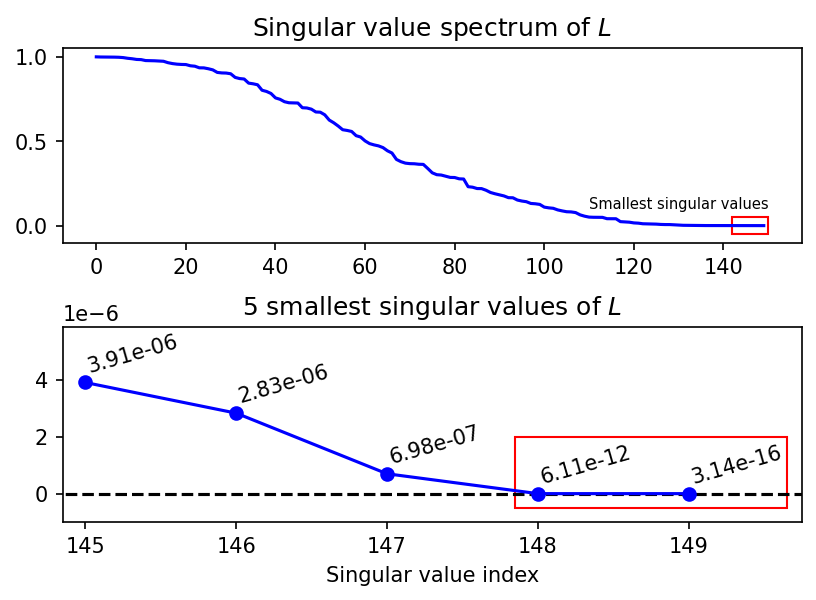

In [12]:
#@markdown The ideal scenario for this algorithm is that the clustering kernel would 
#@markdown consist of the eigenvectors for which the eigenvalues/singular values are zero, 
#@markdown which would correspond to the number of clusters within the data. 
#@markdown However, a number of factors often results in zero not quite being zero in 
#@markdown computational work; for example, floating point values are sometimes 
#@markdown represented as zero by extremely small exponents, often thresholded on the order 
#@markdown of $1\times10^{-6}$ or less (for those interested, refer to the IEEE 754 standard). This is clearly demonstrated in the plot of 
#@markdown the smallest singular values below.

import matplotlib.patches as patches
fig_sv, (ax_sv1, ax_sv2) = plt.subplots(2, 1)
fig_sv.tight_layout(pad=2.0)

ax_sv1.plot(range(len(s)), s, '-b')
ax_sv1.set_title('Singular value spectrum of $L$')
#ax_sv1.set_xlabel('Singular value index')
inset = patches.Rectangle(
    (142, -0.05), 8, 0.1, 
    linewidth=1, 
    edgecolor='r', 
    facecolor='none')
ax_sv1.add_patch(inset)
ax_sv1.text(110, 0.1, 'Smallest singular values', fontsize=7)

x = range(145, 150)
y = s[-5:]

# Zero-boundary
xx, yy = [144, 150], [0, 0]
ax_sv2.plot(xx, yy, '--k')

ax_sv2.plot(x, y, '-bo')
ax_sv2.set_title('5 smallest singular values of $L$')
ax_sv2.set_ylim([-1e-6, 5.85e-6])
ax_sv2.set_xticks(x)
ax_sv2.set_xlim([144.85, 149.75])
ax_sv2.set_xlabel('Singular value index')

cluster_svals = patches.Rectangle(
    (147.85, -5e-7), 1.8, 2.5e-6, 
    linewidth=1, 
    edgecolor='r', 
    facecolor='none')

ax_sv2.add_patch(cluster_svals)

for i, val in enumerate(y):
  ax_sv2.annotate('{:.3g}'.format(val), (x[i], y[i]+np.mean(y)/4), rotation=16)

Despite the robustness of this algorithm, it lacks some optimizations that would make it feasible for serious use. For instance, this algorithm does not implement cluster estimation. Instead, one may infer from inspection of the smallest singular values that the number of clusters in this example is 2; thus, the clustering kernel may be constructed from the eigenvectors corresponding to the two smallest singular values.

In [13]:
# Clustering kernel constructed from 2 smallest singular values
kernel = v[-2:].T

Performing *k*-means clustering with the SVD kernel accurately partitions the data.

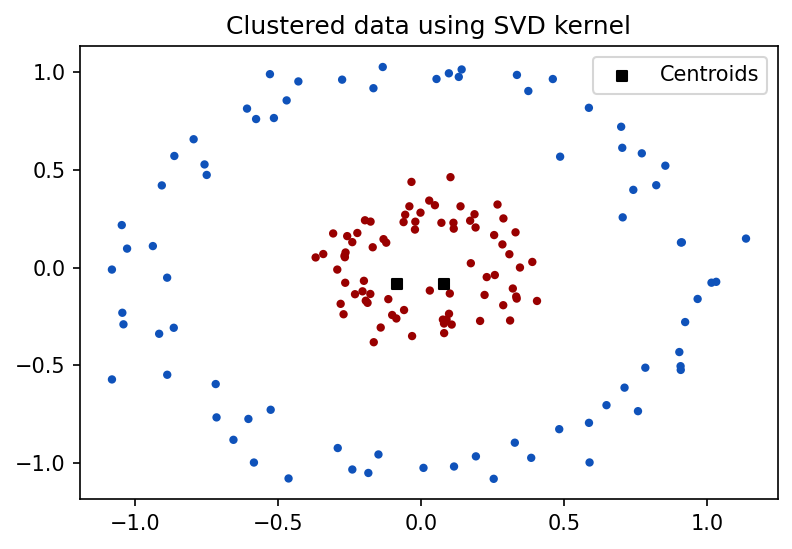

In [14]:
kmean2 = KMeans(n_clusters = 2)
kmean2.fit(kernel)
yK2 = list(kmean2.predict(kernel))
center2 = kmean2.cluster_centers_

for i, x in enumerate(yK2):
  if x == 0:
    yK2[i] = '#0F52BA'
  if x == 1:
    yK2[i] = '#990000'

fig_svd_cluster = plt.figure()
ax_svd_cluster = fig_svd_cluster.add_subplot(111)

ax_svd_cluster.scatter(circle[:,0], circle[:,1], c = yK2, marker='.')
ax_svd_cluster.scatter(center2[:,0], center2[:,1], c = '#000000', marker='s', s = 20, label='Centroids')
ax_svd_cluster.set_title('Clustered data using SVD kernel')
ax_svd_cluster.legend(loc='upper right')
fig_svd_cluster.show()

The example above is extensible, and may be optimized to work with more complicated data. For those wishing to use an existing routine, a spectral clustering function is packaged with `scikit-learn`, for which there exists a [well documented API](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html). It may be invoked by importing `sklearn.cluster.SpectralClustering`.

---

In [17]:
#@markdown **Exercise 2.1** &nbsp;&nbsp;&nbsp; Using the information in this section, generate a random dataset using `make_blobs` or `make_circles`.
#@markdown Construct the normalized graph Laplacian and partition the data using a kernal derived from the SVD of the Laplacian matrix. Check the results against the output of `sklearn.cluster.KMeans` and `sklearn.cluster.SpectralClustering`. Refer to the [`sklearn.cluster` API reference](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.cluster) if necessary. 

#@markdown The functions below have been pre-defined for convenience:
#@markdown ```python
#@markdown make_distance_matrix(data)
#@markdown
#@markdown make_similarity_matrix(distance_matrix, variance)
#@markdown
#@markdown make_degree_matrix(similarity_matrix)
#@markdown
#@markdown make_graph_laplacian_matrix(similarity_matrix, degree_matrix)
#@markdown
#@markdown make_laplacian_from_data(data, rbf_variance)
#@markdown
#@markdown make_kernel(evec, num_clusters)
#@markdown
#@markdown spectral_cluster(data, cluster_kernel)
#@markdown ```

#@markdown These functions focus on matrix inputs and the Radial Basis Function (similarity metric) variance. When attemping to partition especially ambiguous datasets, it may not be straightforward to cluster the data. 
#@markdown Try tuning the `rbf_variance` parameter if the output of `make_blobs` or `make_circles` fails to result in cluster separation after partitioning the data with the kernel.

#@markdown *Execute this cell to instantiate the convenience functions. Additionally, this cell may be expanded to see the code implementations or type hints, if necessary.*

import typing
import numpy.typing as npt
def make_distance_matrix(data: npt.NDArray):
  """
  Construct distance matrix from Euclidian distance/L2 norm of data points.
  ...
  Parameters
  ----------
  data : ndarray
  """
  npts, _         = data.shape
  distance_matrix = np.zeros((npts, npts))
  for i, xi in enumerate(data):
    for j, xj in enumerate(data):
      distance_matrix[i,j] = np.linalg.norm(xi-xj, ord=2)#**2
  
  return distance_matrix

def make_similarity_matrix(distance_matrix: npt.NDArray, rbf_variance: float):
  """
  Construct a similarity/adjacency matrix from a distance matrix given an RBF variance.
  ...
  Parameters
  ----------
  distance_matrix : ndarray
  
  variance : float
      Variance of the embedded Gaussian kernel/RBF used as the similarity metric.
  """
  sigma             = rbf_variance
  metric            = np.power(distance_matrix, 2) / (2*sigma**2)
  similarity_matrix = np.exp(-metric)

  return similarity_matrix

def make_degree_matrix(similarity_matrix: npt.NDArray):
  """
  Construct a degree matrix from a similarity/adjacency matrix
  ...
  Parameters
  ----------
  similarity_matrix : ndarray
  """
  similarity_column_sums = np.sum(similarity_matrix, axis=0)
  degree_matrix          = np.diag(similarity_column_sums)

  return degree_matrix

def make_graph_laplacian_matrix(similarity_matrix: npt.NDArray, degree_matrix: npt.NDArray):
  """
  Construct the graph Laplacian from a similarity and degree matrix
  ...
  Parameters
  ----------
  similarity_matrix : ndarray

  degree_matrix : ndarray
  """
  identity_matrix   = np.eye(len(similarity_matrix))
  degree_matrix_inv = np.linalg.pinv(degree_matrix)
  random_walk       = np.matmul(degree_matrix_inv, similarity_matrix)
  laplacian_matrix  = identity_matrix - random_walk

  return laplacian_matrix

def make_laplacian_from_data(data: npt.NDArray, rbf_variance: float):
  """
  Construct the graph Laplacian directly from data and an RBF variance
  ...
  Parameters
  ----------
  data : ndarray

  rbf_variance : float
  """
  distance    = make_distance_matrix(data)
  similarity  = make_similarity_matrix(distance, rbf_variance)
  degree      = make_degree_matrix(similarity)
  laplacian   = make_graph_laplacian_matrix(similarity, degree)

  return laplacian

def make_kernel(evec: npt.NDArray, num_clusters: int):
  """
  Constructs a clustering kernel from an SVD eigenvector matrix.
  ...
  Parameters
  ----------
  v : ndarray
      SVD eigenvector matrix.

  num_clusters : int
      Number of clusters expected within the data.
  """
  kernel = evec[-num_clusters:].T

  return kernel

def spectral_cluster(data: npt.NDArray, cluster_kernel: npt.NDArray):
  """
  Plots results of spectral clustering of data.
  ...
  Parameters
  ----------
  data : ndarray
      Data to be clustered.

  cluster_kernel : ndarray
      Clustering kernel with dimensions proportional to number of expected clusters.
  """
  spectral_kmean = KMeans(n_clusters = cluster_kernel.shape[1])
  spectral_kmean.fit(cluster_kernel)
  spectral_yK = spectral_kmean.predict(cluster_kernel)

  fig_svd_cluster = plt.figure()
  ax_svd_cluster = fig_svd_cluster.add_subplot(111)

  ax_svd_cluster.scatter(data[:,0], data[:,1], c = spectral_yK, cmap='jet')
  ax_svd_cluster.set_title('Clustered data using SVD kernel')
  fig_svd_cluster.show()

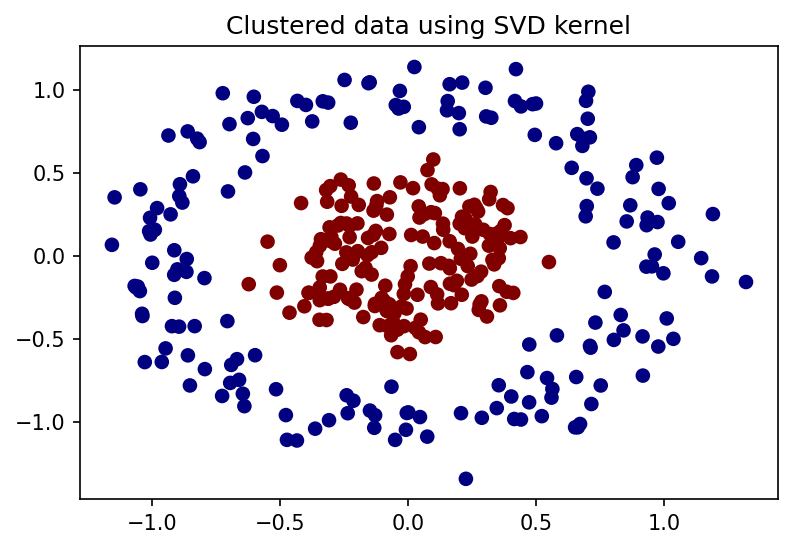

In [18]:
# ~~~~~~~~~ Exercise 2.1 ~~~~~~~~
# 1. Generate data
# 2. Construct graph laplacian
# 3. SVD of graph laplacian
# 4. Make kernel
# 5. Cluster data
# ~~~~~~~ Code Goes Below ~~~~~~~
circle1, _ = make_circles(
    n_samples     = 350, 
    noise         = 0.125, 
    factor        = 0.3, 
    random_state  = 0
    )

lapl = make_laplacian_from_data(circle1, 0.08)
_, s, v = np.linalg.svd(lapl, full_matrices = False)
k = make_kernel(v, 2)
spectral_cluster(circle1, k)

# **Principal Component Analysis (PCA)**

Principal component analysis (PCA) is an eigenbasis analysis method that analyzes the spectrum of high-dimensionality data, effectively reducing the number of dimensions within the data while retaining characteristic features of the dataset. Similar to the clustering example in the previous section, PCA utilizes the singular value decomposition of data to transform the data into a new basis.

Consider an experiment in which volunteers with lung tumors of various sizes are subjected to different doses of radiation to determine the ideal dosimetry for diminishing the mass of the tumor.

This experiment involves 3D computed tomogography (CT) imaging to determine the dimensions of the tumor, from which an estimation of the mass of the tumor is calculated from the known density of the particular tissue class of which the tumor is comprised.

Following an initial round of imaging and tumor mass estimation, various doses of X-rays across 15 treatment sessions are delivered via a stereotactic radiosurgery protocol.

<center><img src="https://github.com/GDS-Education-Community-of-Practice/DSECOP/blob/main/Singular_Value_Decomposition/Resources/experiment.png?raw=true" width=873.2 height=406.2></center>


After treatment, CT imaging is performed to quantify any diminution of the tumor. The results of the change in tumor mass versus the radiation dose are shown in the plot below.

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

plt.rcParams['figure.dpi'] = 150

# Number of participants in the experiment.
N = 150

# Generate pseudo-random data
rng       = np.random.default_rng(26752218745)
rand_mass = rng.random(N)
jitter    = rng.uniform(-0.175, 0.125, [N])

# Study data consists of dose and change in tumor mass.
dose            = np.linspace(30 - (N*0.05), 70 + (N*0.05), num=N)
change_in_mass  = (m := [(i * np.exp(x) / N) + jitter[i] for i, x in enumerate(rand_mass)]) + abs(min(m))

td = {
    'Dose'      : dose, 
    'MassDelta' : change_in_mass
    }

tumor_data = pd.DataFrame(td)

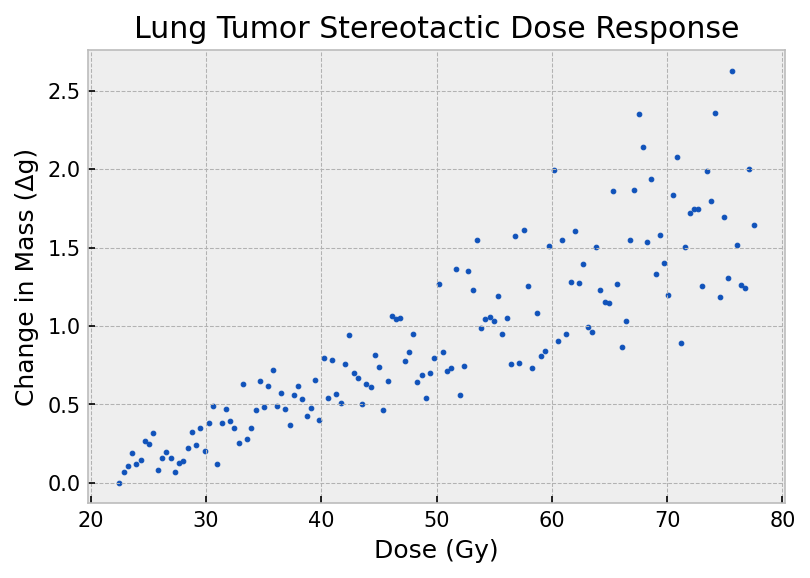

In [32]:
#@markdown
with plt.style.context('bmh'):
  tumor_data.plot(kind='scatter', x='Dose', y='MassDelta', marker='.', c='#0F52BA')
  plt.title('Lung Tumor Stereotactic Dose Response')
  plt.xlabel('Dose (Gy)')
  plt.ylabel('Change in Mass (Δg)')
  plt.show()

### **Standardization**

An important first step in manipulating data is *standardization*, a process in which the data is rescaled such that the mean of the data is 0 (a.k.a. mean-centered) and the standard deviation is 1. This is also known as *Z*-scoring the data, given by

\begin{equation}
  Z = \frac{x - \mu}{\sigma}
\end{equation}

where $x$ is a datum or observed value in a dataset, $\mu$ is the mean of the data, and $\sigma$ is the standard deviation of the data.

Determining the *Z*-score of the data is important in PCA because features with high variance are weighted more heavily than those with low variance. This means that the significance of a principal component may be unduly biased by an artificially large difference in variance between the components that could simply be a product of the units of measurement or the range of valid or measured values of a feature. For instance, notice the span of the *Dose* feature versus the scale of the *Change in Mass* feature in the plot above. A good rule-of-thumb is that PCA will not yield functional results without standardizing the data.

The standardized data may be seen in the plot below; note how the range of each feature has been transformed to minimize artifical variance between the features.

In [33]:
# Cast the dataframe to a numpy matrix
tumor_data_matrix = tumor_data.to_numpy()
# Z-score the data (column-wise )
tumor_data_standardized = ((td := tumor_data_matrix) - td.mean(axis = 0)) / td.std(axis = 0)

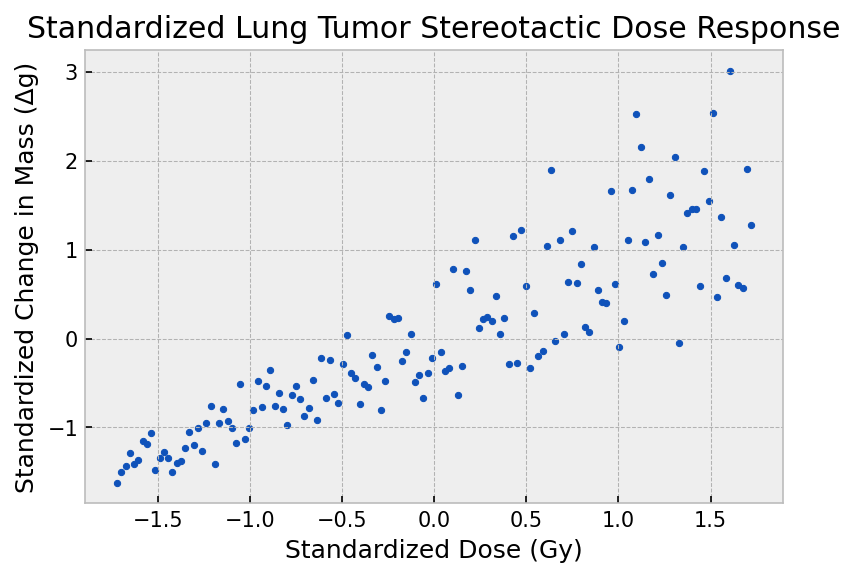

In [34]:
#@markdown
with plt.style.context('bmh'):
  fig_stnd = plt.figure()
  ax_stnd = fig_stnd.add_subplot(111)

  ax_stnd.scatter((tdm := tumor_data_standardized)[:,0], tdm[:,1], marker='.', c='#0F52BA', zorder=1, label="Standardized Data")
  ax_stnd.set_title('Standardized Lung Tumor Stereotactic Dose Response')
  ax_stnd.set_xlabel('Standardized Dose (Gy)')
  ax_stnd.set_ylabel('Standardized Change in Mass (Δg)')
  fig_stnd.show()

### **Covariance**

The fundament of PCA is differences in variance, $\sigma^2$, between features, where variance is simply a measure of the dispersion of the data, given by

\begin{equation}
  \sigma^2 = \frac{\sum(x_i - \bar{x})^2}{n-1}
\end{equation}

where $\bar{x}$ is used to denote the mean of some feature $x$, and $n$ is the number of data points.

Consider that the variance of some variable $x$ may be expressed as the *covariance* of the variable with itself. To that effect, the covariance of two variables is a measure of how much one variable affects the variance of the other variable. Covariance is given similarly to variance, extended to the case of two unique features, as

\begin{equation}
  \text{cov}_{x,y} = \frac{\sum(x_i - \bar{x})(y_i - \bar{y})}{n-1}
\end{equation}

A square covariance matrix may then be computed to express the covariance between all points in a dataset. The covariance matrix may be directly computed via `numpy` using the `np.cov` routine.

In [35]:
tumor_data_covariance = np.cov(tumor_data_standardized, ddof = 0, rowvar = False)

### **Singular Value Decomposition and Principal Components**

Computing the SVD of the covariance matrix of the standardized data will yield the eigenvectors describing the axes of the new feature-space of the data; i.e., the space into which the data are being projected. The singular value of a given eigenvector will provide information about the significance of the information relayed by that eigenvector. After computing the $s$ and $v$ components of the SVD, the components may be ranked by $|s|$ to visualize their significance. These components are the *principal components* of the data.

In [36]:
# Compute SVD of the covariance matrix
_, s, v = np.linalg.svd(tumor_data_covariance, full_matrices = False)

# Rank eigenvectors by absolute singular values
components = [(np.abs(s[i]), v[:,i]) for i in range(len(s))]

print('Principle Components Ranked by Absolute Singular Value\n')
print('Rank \t Singular values \t Eigenvectors')
print('---- \t --------------- \t ------------')
for i, (a, b) in enumerate(components):
  print(f'{i+1} \t {a} \t {b}')

Principle Components Ranked by Absolute Singular Value

Rank 	 Singular values 	 Eigenvectors
---- 	 --------------- 	 ------------
1 	 1.8775645924690292 	 [-0.70710678 -0.70710678]
2 	 0.12243540753097122 	 [-0.70710678  0.70710678]


### **Explained Variance**

The example experiment around which this lesson is framed offers a simple, low-dimensionality feature space from which a new feature subspace is easily determined, in that a subspace of 1 dimension is the obvious choice for projecting 2-dimensional data.

For higher dimensionality data, the subspace dimension may be determined by analyzing the *explained variance* of the feature space. The explained variance offers insight into how much variance is attributed to each principal component.

In [37]:
expvar = np.fromiter(((x / s.sum()) for (x, _) in components), dtype=float)
expvar_fold = np.cumsum(expvar)

explained_variance = list(zip(expvar, expvar_fold))

print('Explained Variance of Principal Components Ranked by |s|\n')
print('Principal Component \t\t \033[1;34mExplained Variance\033[0m \t Cumulative Variance')
print('------------------- \t\t \033[1;34m------------------\033[0m \t -------------------')
for i, (a, b) in enumerate(explained_variance):
  print(f'Principal Component {i+1} \t\t \033[1;34m{a:%}\033[0m \t\t {b:%}')

Explained Variance of Principal Components Ranked by |s|

Principal Component 		 Explained Variance 	 Cumulative Variance
------------------- 		 ------------------ 	 -------------------
Principal Component 1 		 93.878230% 		 93.878230%
Principal Component 2 		 6.121770% 		 100.000000%


It is apparent from the explained variance that the first principal component accounts for ~94% of the total variance of the data; it is also apparent that the data could be dutifully represented in the feature subspace of the first principal component.

### **Subspace Projection**

Following the determination of the new feature space, or subspace, the data may be transformed into the new space from the eigenvectors of the principal components comprising that subspace. This is done via a *projection matrix* whose shape is that of the subspace.

In [38]:
# Projection Matrix
tumor_data_pca_transform = np.dot(tumor_data_standardized, v[:1].T)

From the projection matrix, the data may be transformed back into the original space via an inverse transform.

In [39]:
# Subspace projection
tumor_data_pca_projection = np.dot(tumor_data_pca_transform, v[:1])

Visualizing the lower-dimension projection of the data against the original data clearly shows the relationship between the two variables. The information contained within the data has been well preserved despite the projection into a lower dimension space.

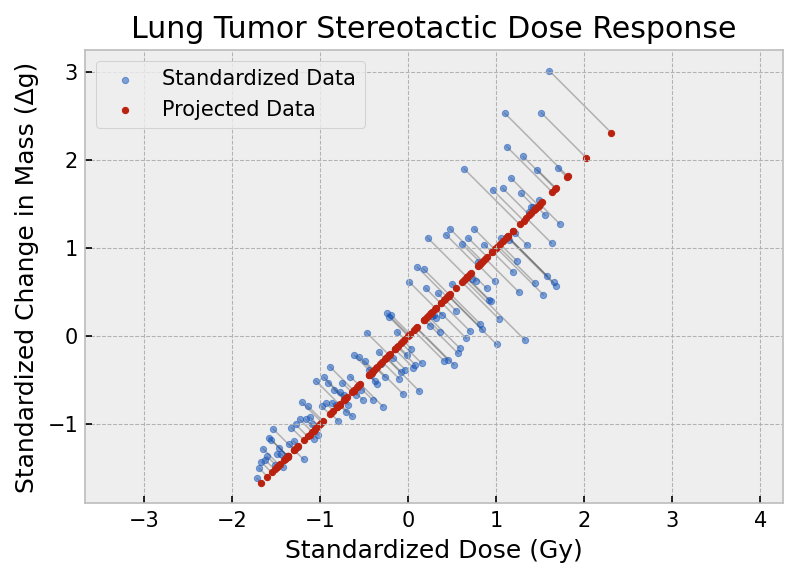

In [40]:
#@markdown 

with plt.style.context('bmh'):
  fig_pca = plt.figure()
  ax_pca = fig_pca.add_subplot(111)

  ax_pca.scatter((tdm := tumor_data_standardized)[:,0], tdm[:,1], alpha=0.5, marker='.', c='#0F52BA', zorder=1, label="Standardized Data")
  ax_pca.scatter((to := tumor_data_pca_projection)[:,0], to[:,1], marker='.', c='#BA220F', zorder=1, label="Projected Data")

  x = [tumor_data_standardized[:,0], tumor_data_pca_projection[:,0]]
  y = [tumor_data_standardized[:,1], tumor_data_pca_projection[:,1]]
  ax_pca.plot(x, y, c='k', linestyle="-", linewidth=0.75, zorder=0, alpha=0.25)

  ax_pca.set_title('Lung Tumor Stereotactic Dose Response')
  ax_pca.set_xlabel('Standardized Dose (Gy)')
  ax_pca.set_ylabel('Standardized Change in Mass (Δg)')
  ax_pca.legend()

  ax_pca.axis('equal')

  fig_pca.show()

### **Discussion**

PCA attempts to find the axes along which the variance of the data is maximized; i.e., the principal components. In the example above, the variance through the center of the data is greater than the variance on either of the axes of the original space. Despite being expressed in a single dimension, the correlations within the data are largely preserved.

Dimensionality reduction is not the only benefit of PCA. Datasets that are difficult to cluster may be more easily separable when projected into a different subspace, making it easier to perform *K*-means or spectral clustering. The image compression example at the beginning of this module is fundamentally similar to PCA, in that the image is reconstructed using eigenvectors that account for some significant fraction of the total information in the image.

In practical applications, PCA may be applied to datasets with many more dimensions than the two dimensions in this example. For examples of PCA in higher dimensions, such as the canonical example using the [Iris dataset](https://archive.ics.uci.edu/ml/datasets/iris), `scikit-learn` maintains [examples](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html#examples-using-sklearn-decomposition-pca) in the `sklearn.decomposition.PCA` namespace at the bottom of the page.